In [1]:
import keras
import tensorflow as tf
import gdal
import os
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
from keras_unet.models import custom_unet, satellite_unet
from keras_unet.metrics import iou, iou_thresholded
from keras_unet.losses import jaccard_distance
from keras_unet.utils import plot_segm_history

-----------------------------------------
keras-unet init: TF version is >= 2.0.0 - using `tf.keras` instead of `Keras`
-----------------------------------------


In [4]:
base_dir = Path(r'/media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2')
mask_dir = base_dir.joinpath('masks_img')
image_dir = Path(r'/media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/img')
water_dir = mask_dir.joinpath('water')
shrubs_dir = mask_dir.joinpath('shrub')
taiga_dir = mask_dir.joinpath('taiga')

In [5]:
test = gdal.Open(r'//media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/img/img_1.tif', gdal.GA_ReadOnly)

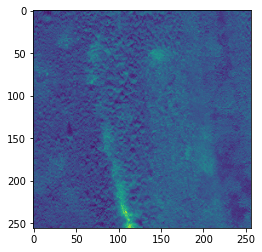

In [6]:
plt.imshow(test.GetRasterBand(1).ReadAsArray())

In [13]:
def make_path(img_dir, prefix, number):
    return os.path.join(img_dir, f"{prefix}_{number}.tif")

In [14]:
def img_number(fpath: str) -> int:
    return int(os.path.splitext(os.path.split(fpath)[1])[0].split('_')[-1])

In [15]:
import typing as t

def load_image_rgb(path: str, shape: t.Tuple[int,int,int], dtype) -> np.ndarray:
    image = np.zeros(shape = shape, dtype=dtype)
    ds= gdal.Open(path, gdal.GA_ReadOnly)
    for i in (1, 2, 3):
        image[:, :, i-1] = ds.GetRasterBand(i).ReadAsArray()
    return image



In [16]:
def load_image(path: str) -> np.ndarray:
    ds = gdal.Open(path, gdal.GA_ReadOnly)
    return ds.GetRasterBand(1).ReadAsArray()

In [17]:
def load_stack_rgb(shape, dtype, img_dir, prefix):
    stack = np.zeros(shape = shape, dtype = dtype)
    for i in range(shape[0]):
        image_path = make_path(img_dir, prefix, i + 1)
        # subsets for rgb bands only
        stack[i, :, :, :] = load_image_rgb(image_path, (shape[1], shape[2], shape[3]), dtype)
    return stack

# need to skip when there is no mask
# loads single band mask
def load_stack_safely(shape, dtype, img_dir, prefix):
    stack = np.zeros(shape = shape, dtype = dtype)
    for i in range(shape[0]):
        image_path = make_path(img_dir, prefix, i + 1)
        if not os.path.isfile(image_path):
            print("skipping", image_path)
            continue
        stack[i, :, :] = load_image(image_path)
    return stack

In [18]:
# training total data size
I = 225
# image dim 1
N = 256
# image dim 2
M = 256
# number of image bands
L = 3
# number of classes
V = 3

In [19]:
train_images = load_stack_rgb((I, N, M, L), np.int8, image_dir, "img")
train_images_R = train_images.reshape(I, N, M, L)

In [20]:
train_images_R.shape

(225, 256, 256, 3)

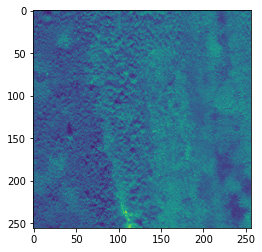

In [22]:
plt.imshow(train_images[0, :,:,1])

In [23]:
water_mask = load_stack_safely((I, N, M), np.int8, water_dir, "water")
trees_mask = load_stack_safely((I, N, M), np.int8, taiga_dir, "taiga")
shrubs_mask = load_stack_safely((I, N, M), np.int8, shrubs_dir, "shrub")

skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/water/water_1.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/water/water_2.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/water/water_3.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/water/water_4.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/water/water_6.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/water/water_9.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/water/water_11.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/water/water_16.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/water/water_17.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks

skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/shrub/shrub_36.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/shrub/shrub_40.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/shrub/shrub_41.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/shrub/shrub_45.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/shrub/shrub_48.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/shrub/shrub_51.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/shrub/shrub_52.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/shrub/shrub_54.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/shrub/shrub_56.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2

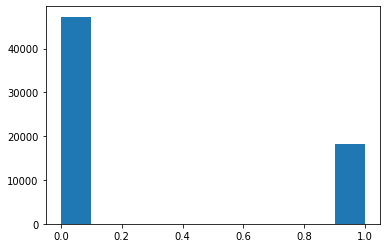

In [24]:
plt.hist(water_mask[9, :,:].flatten())
plt.show()

In [25]:
trees_mask.shape

(225, 256, 256)

In [26]:
test_sub = trees_mask[100:125, :, :]

In [27]:
test_sub.shape

(25, 256, 256)

In [28]:
# Hold images 100-125 for testing threshold

W = 200
Y = np.zeros(shape=(W, N, M, V), dtype =np.int8)
Y_train_img = np.zeros(shape=(W, N, M, L), dtype =np.float32)

Y[0:100, :, :, 0] = trees_mask[0:100, :, :]
Y[0:100, :, :, 1] = water_mask[0:100, :, :]
Y[0:100, :, :, 2] = shrubs_mask[0:100, :, :]
Y_train_img[0:100, :, :, :] = train_images_R[0:100, :, :, :]

Y[100:200, :, :, 0] = trees_mask[125:225, :, :]
Y[100:200, :, :, 1] = water_mask[125:225, :, :]
Y[100:200, :, :, 2] = shrubs_mask[125:225, :, :]
Y_train_img[100:200, :, :, :] = train_images_R[125:225, :, :, :]



In [29]:
K = 25
Y_valid = np.zeros(shape=(K, N, M, V), dtype =np.int8)
Y_valid_img = np.zeros(shape=(K, N, M, L), dtype =np.float32)

Y_valid[0:25, :, :, 0] = trees_mask[100:125, :, :]
Y_valid[0:25, :, :, 1] = water_mask[100:125, :, :]
Y_valid[0:25, :, :, 2] = shrubs_mask[100:125, :, :]
Y_valid_img[0:25, :, :, :] = train_images_R[100:125, :, :, :]

In [30]:
Y.shape

(200, 256, 256, 3)

In [31]:
Y_train_img.shape

(200, 256, 256, 3)

In [32]:
Y_valid.shape

(25, 256, 256, 3)

In [33]:
Y_valid_img.shape

(25, 256, 256, 3)

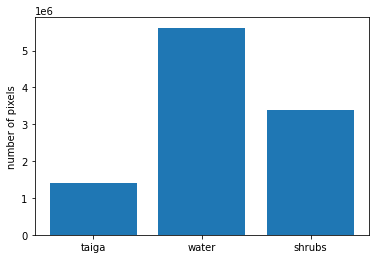

In [36]:
fig, ax = plt.subplots()
ax.bar(range(V), [trees_mask.sum(), water_mask.sum(), shrubs_mask.sum()])
ax.set_xticks((0, 1, 2))
ax.set_xticklabels(('taiga', 'water', 'shrubs'))
plt.ylabel('number of pixels')
plt.show()

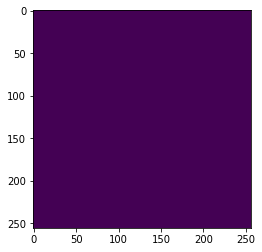

In [39]:
plt.imshow(Y[3,:,:,1])

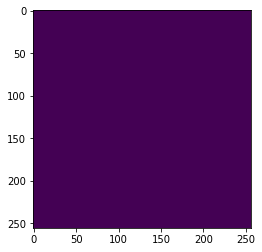

In [40]:
plt.imshow(water_mask[3,:, :])

In [41]:
# alter unet code from package
from keras_unet import TF
if TF:
    from tensorflow.keras.models import Model
    from tensorflow.keras.layers import ( 
        BatchNormalization, Conv2D, Conv2DTranspose,
        MaxPooling2D, UpSampling2D, Input,
        concatenate
    )
else:    
    from keras.models import Model
    from keras.layers import ( 
        BatchNormalization, Conv2D, Conv2DTranspose,
        MaxPooling2D, UpSampling2D, Input,
        concatenate
    )


def bn_conv_relu(input, filters, bachnorm_momentum, **conv2d_args):
    x = BatchNormalization(momentum=bachnorm_momentum)(input)
    x = Conv2D(filters, **conv2d_args)(x)
    return x

def bn_upconv_relu(input, filters, bachnorm_momentum, **conv2d_trans_args):
    x = BatchNormalization(momentum=bachnorm_momentum)(input)
    x = Conv2DTranspose(filters, **conv2d_trans_args)(x)
    return x

def satellite_unet2(
    input_shape,
    num_classes=1,
    output_activation='sigmoid',
    num_layers=4):

    inputs = Input(input_shape)   
    
    filters = 64
    upconv_filters = 96

    kernel_size = (5,5)
    activation = 'relu'
    strides = (1,1)
    padding = 'same'
    kernel_initializer = 'he_normal'

    conv2d_args = {
        'kernel_size':kernel_size,
        'activation':activation, 
        'strides':strides,
        'padding':padding,
        'kernel_initializer':kernel_initializer
        }

    conv2d_trans_args = {
        'kernel_size':kernel_size,
        'activation':activation, 
        'strides':(2,2),
        'padding':padding,
        'output_padding':(1,1)
        }

    bachnorm_momentum = 0.01

    pool_size = (2,2)
    pool_strides = (2,2)
    pool_padding = 'valid'

    maxpool2d_args = {
        'pool_size':pool_size,
        'strides':pool_strides,
        'padding':pool_padding,
        }
    
    x = Conv2D(filters, **conv2d_args)(inputs)
    c1 = bn_conv_relu(x, filters, bachnorm_momentum, **conv2d_args)    
    x = bn_conv_relu(c1, filters, bachnorm_momentum, **conv2d_args)
    x = MaxPooling2D(**maxpool2d_args)(x)

    down_layers = []

    for l in range(num_layers):
        x = bn_conv_relu(x, filters, bachnorm_momentum, **conv2d_args)
        x = bn_conv_relu(x, filters, bachnorm_momentum, **conv2d_args)
        down_layers.append(x)
        x = bn_conv_relu(x, filters, bachnorm_momentum, **conv2d_args)
        x = MaxPooling2D(**maxpool2d_args)(x)

    x = bn_conv_relu(x, filters, bachnorm_momentum, **conv2d_args)
    x = bn_conv_relu(x, filters, bachnorm_momentum, **conv2d_args)
    x = bn_upconv_relu(x, filters, bachnorm_momentum, **conv2d_trans_args)

    for conv in reversed(down_layers):        
        x = concatenate([x, conv])  
        x = bn_conv_relu(x, upconv_filters, bachnorm_momentum, **conv2d_args)
        x = bn_conv_relu(x, filters, bachnorm_momentum, **conv2d_args)
        x = bn_upconv_relu(x, filters, bachnorm_momentum, **conv2d_trans_args)

    x = concatenate([x, c1])
    x = bn_conv_relu(x, upconv_filters, bachnorm_momentum, **conv2d_args)
    x = bn_conv_relu(x, filters, bachnorm_momentum, **conv2d_args)
           
    outputs = Conv2D(num_classes, kernel_size=(1,1), strides=(1,1), activation=output_activation, padding='valid') (x)       
    
    model = Model(inputs=[inputs], outputs=[outputs])
    return model

In [55]:
model = satellite_unet2((N, M, 3), V)

In [56]:
model.compile(
    optimizer = tf.keras.optimizers.Adam(),
    loss = "binary_crossentropy",
    metrics = [iou, iou_thresholded],
)

In [57]:
history = model.fit(Y_train_img, Y, epochs = 75)

Epoch 1/75
7/7 [==============================] - 126s 17s/step - loss: 0.4921 - iou: 0.4437 - iou_thresholded: 0.5075
Epoch 2/75
7/7 [==============================] - 119s 17s/step - loss: 0.2821 - iou: 0.5572 - iou_thresholded: 0.6283
Epoch 3/75
7/7 [==============================] - 115s 16s/step - loss: 0.2755 - iou: 0.5985 - iou_thresholded: 0.6752
Epoch 4/75
7/7 [==============================] - 116s 16s/step - loss: 0.1900 - iou: 0.6507 - iou_thresholded: 0.7475
Epoch 5/75
7/7 [==============================] - 120s 16s/step - loss: 0.1781 - iou: 0.6362 - iou_thresholded: 0.7109
Epoch 6/75
7/7 [==============================] - 120s 17s/step - loss: 0.2089 - iou: 0.6018 - iou_thresholded: 0.6693
Epoch 7/75
7/7 [==============================] - 131s 19s/step - loss: 0.1691 - iou: 0.6925 - iou_thresholded: 0.7623
Epoch 8/75
7/7 [==============================] - 139s 19s/step - loss: 0.1418 - iou: 0.7028 - iou_thresholded: 0.7991
Epoch 9/75
7/7 [==============================] 

7/7 [==============================] - 117s 16s/step - loss: 0.0817 - iou: 0.8029 - iou_thresholded: 0.8539
Epoch 70/75
7/7 [==============================] - 117s 16s/step - loss: 0.1005 - iou: 0.7786 - iou_thresholded: 0.8473
Epoch 71/75
7/7 [==============================] - 118s 17s/step - loss: 0.0919 - iou: 0.7979 - iou_thresholded: 0.8558
Epoch 72/75
7/7 [==============================] - 117s 16s/step - loss: 0.0926 - iou: 0.7963 - iou_thresholded: 0.8666
Epoch 73/75
7/7 [==============================] - 113s 16s/step - loss: 0.0752 - iou: 0.8152 - iou_thresholded: 0.8701
Epoch 74/75
7/7 [==============================] - 117s 17s/step - loss: 0.0874 - iou: 0.8107 - iou_thresholded: 0.8576
Epoch 75/75
7/7 [==============================] - 117s 17s/step - loss: 0.0863 - iou: 0.7862 - iou_thresholded: 0.8488


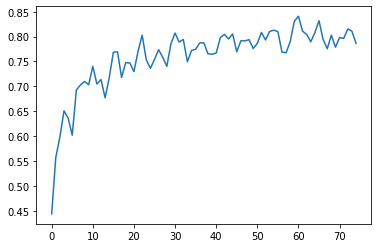

In [58]:
plt.plot(history.history['iou'])

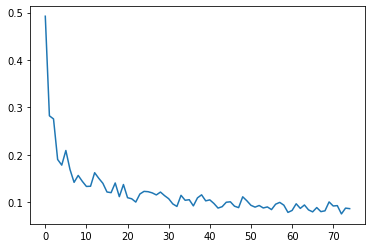

In [59]:
plt.plot(history.history['loss'])

In [35]:
modelsave_path = Path(r'/media/hkropp/research/Kolyma_Data/training/model/2020_k5')

In [36]:
model.save(modelsave_path)

INFO:tensorflow:Assets written to: /media/hkropp/research/Kolyma_Data/training/model/2020_k5/assets


INFO:tensorflow:Assets written to: /media/hkropp/research/Kolyma_Data/training/model/2020_k5/assets


In [60]:
Y_pred = model.predict(Y_train_img)

7/7 [==============================] - 43s 6s/step


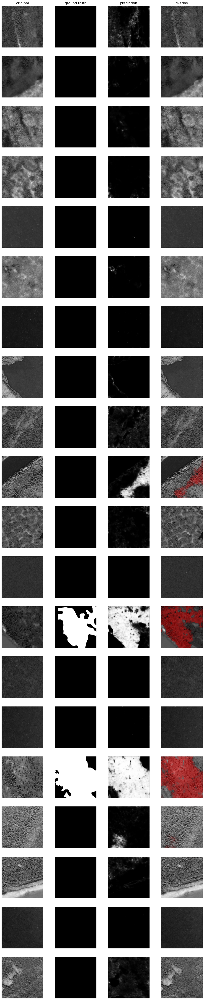

In [61]:
from keras_unet.utils import plot_imgs

# trees
plot_imgs(
    org_imgs=Y_train_img.reshape(200, N, M, 3)[:,:,:,0], 
    mask_imgs=Y[:, :, :, 0], 
    pred_imgs=Y_pred[:, :, :, 0], 
    nm_img_to_plot=20
  )

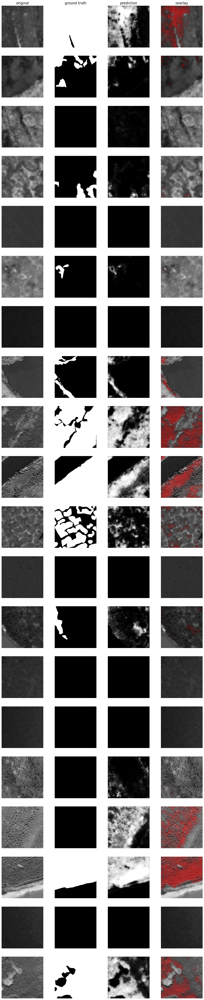

In [62]:
# Shrubs
plot_imgs(
    org_imgs=Y_train_img.reshape(200, N, M, 3)[:,:,:,0], 
    mask_imgs=Y[:, :, :, 2], 
    pred_imgs=Y_pred[:, :, :, 2], 
    nm_img_to_plot=20
  )

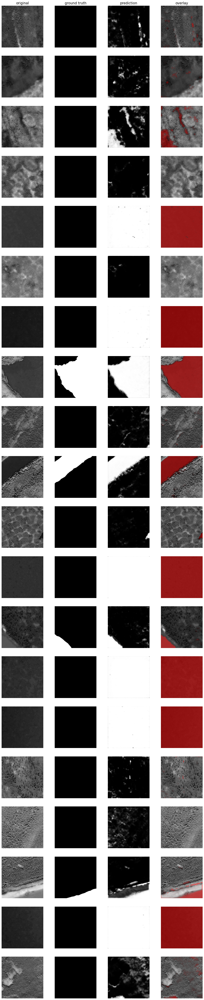

In [63]:
# water
plot_imgs(
    org_imgs=Y_train_img.reshape(200, N, M, 3)[:,:,:,0], 
    mask_imgs=Y[:, :, :, 1], 
    pred_imgs=Y_pred[:, :, :, 1], 
    nm_img_to_plot=20
  )

In [64]:
valid_pred = model.predict(Y_valid_img)

1/1 [==============================] - 2s 2s/step


In [65]:
valid_pred[1,:, :, 0]

array([[0.10766788, 0.03283553, 0.01787146, ..., 0.02291874, 0.02128427,
        0.05532681],
       [0.03226567, 0.01261034, 0.00976885, ..., 0.01715706, 0.01366463,
        0.03320941],
       [0.02316554, 0.01431512, 0.0105536 , ..., 0.01924686, 0.01084921,
        0.02999066],
       ...,
       [0.02634683, 0.00858246, 0.00303194, ..., 0.00091157, 0.00199879,
        0.02054752],
       [0.05788537, 0.01566546, 0.00716713, ..., 0.00642392, 0.01264496,
        0.06041924],
       [0.12753578, 0.05711212, 0.02107823, ..., 0.01891533, 0.0272741 ,
        0.10199506]], dtype=float32)

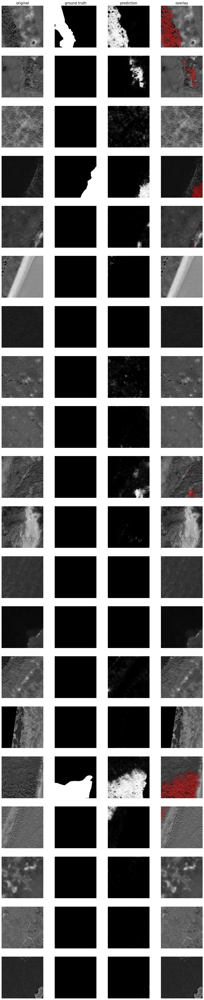

In [66]:
# Trees
plot_imgs(
    org_imgs=Y_valid_img.reshape(25, N, M, 3)[:,:,:,0], 
    mask_imgs=Y_valid[:, :, :, 0], 
    pred_imgs=valid_pred[:, :, :, 0], 
    nm_img_to_plot=20
  )

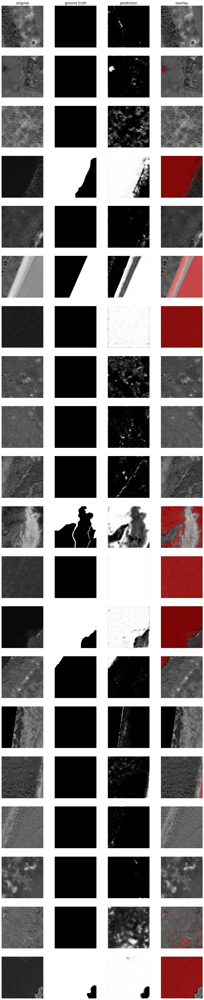

In [67]:
# Water
plot_imgs(
    org_imgs=Y_valid_img.reshape(25, N, M, 3)[:,:,:,0], 
    mask_imgs=Y_valid[:, :, :, 1], 
    pred_imgs=valid_pred[:, :, :, 1], 
    nm_img_to_plot=20
  )

In [47]:
waterPredict = valid_pred[:,:,:,1]

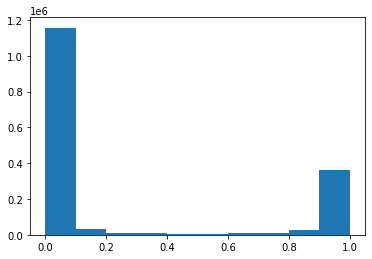

In [48]:
plt.hist(waterPredict.flatten())
plt.show()

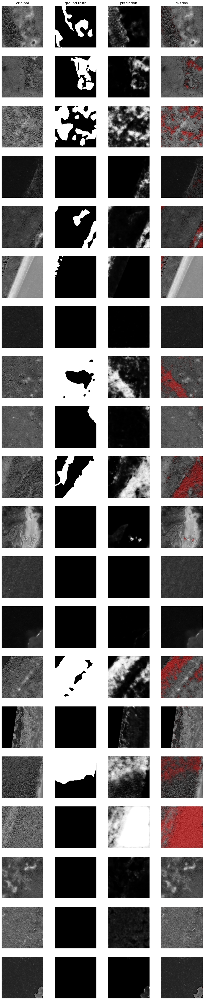

In [68]:
# Shrubs
plot_imgs(
    org_imgs=Y_valid_img.reshape(25, N, M, 3)[:,:,:,0], 
    mask_imgs=Y_valid[:, :, :, 2], 
    pred_imgs=valid_pred[:, :, :, 2], 
    nm_img_to_plot=20
  )

In [51]:
Y_valid[0,0,0,0]

0

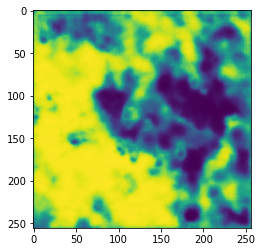

In [52]:
plt.imshow(valid_pred[7,:, :,2])

In [69]:
driver = gdal.GetDriverByName("GTiff")

In [70]:
driver.Register()

2

In [72]:
image_dir

PosixPath('/media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/img')

In [73]:
base_dirP = Path(r'/media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256')

In [74]:
tiles = os.listdir(base_dirP)

In [75]:
T = len(tiles)

In [76]:
predict_img = load_stack_rgb((T, N, M, 3), np.int8,base_dirP, "img")

In [77]:
predict_img.shape

(12144, 256, 256, 3)

In [78]:
Y_all = model.predict(predict_img.reshape(T, N, M, 3))

380/380 [==============================] - 1451s 4s/step


In [79]:
Y_all.shape

(12144, 256, 256, 3)

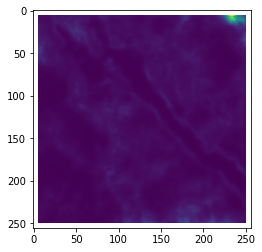

In [80]:
# change edges to missing data
Y_trim = Y_all
Y_trim[:,0:5,:,:] = np.nan
Y_trim[:,:,0:5,:] = np.nan
Y_trim[:,251:256,:,:] = np.nan
Y_trim[:,:,251:256,:] = np.nan
plt.imshow(Y_trim[1000,:,:,2])

In [81]:
def save_predict_tree( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path(base_dirP, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_trim[i, :, :, 0])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [82]:
tree_pred_dir = r'/media/hkropp/research/Kolyma_Data/predictions/v2/2020_k5_1/taiga'
save_predict_tree(nImg = T,xdim= 256, ydim= 256,img_dir = tree_pred_dir,prefix = "taiga_predict",orig_dir = base_dirP , prefix_orig = "img")

In [83]:
def save_predict_water( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path(base_dirP, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_trim[i, :, :, 1])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [84]:
water_pred_dir = r'/media/hkropp/research/Kolyma_Data/predictions/v2/2020_k5_1/water'
save_predict_water(nImg = T,xdim= 256, ydim= 256,img_dir = water_pred_dir,prefix = "water_predict",orig_dir = base_dirP , prefix_orig = "img")

In [85]:
def save_predict_shrub( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path(base_dirP, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_trim[i, :, :, 2])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [86]:
shrub_pred_dir = r'/media/hkropp/research/Kolyma_Data/predictions/v2/2020_k5_1/shrub'
save_predict_shrub(nImg = T,xdim= 256, ydim= 256,img_dir = shrub_pred_dir,prefix = "shrub_predict",orig_dir = base_dirP , prefix_orig = "img")

In [87]:
# check for partial tiles




test = load_image(r'/media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_11.tif')

In [88]:
base_dirP2 = Path(r'/media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2')

tiles2 = os.listdir(base_dirP2)

T2 = len(tiles2)
imgD1 = np.zeros((T2,2), dtype=int)

In [89]:
T2

12276

In [90]:
for i in range(T2):
    tileLoad = load_image(make_path(base_dirP2, "img", i + 1))
    imgD1[i,0] = tileLoad.shape[0]
    imgD1[i,1] = tileLoad.shape[1]

In [99]:
imgFlag = np.zeros((T2), dtype=int)

for i in range(T2):
    if imgD1[i,0] < 256 or imgD1[i,1] < 256:
        imgFlag[i] = 1
    else:
        imgFlag[i] = 0

In [100]:
imgFlag

array([0, 0, 0, ..., 1, 1, 1])

In [101]:
imgTable = np.zeros((T2,2), dtype=int)
for i in range(T2):
    imgTable[i,0] = imgFlag[i]
    imgTable[i,1] = i+1

In [102]:
def load_stack_tiles(shape, dtype, img_dir, prefix, imgFlag):
    stack = np.zeros(shape = shape, dtype = dtype)
    for i in range(shape[0]):
        tilepath = make_path(img_dir, prefix, i + 1)
        if imgFlag[i,0] == 1:
            print("nullified", tilepath)
            stack[i,:,:,:] = np.zeros(shape = (shape[1], shape[2], shape[3]), dtype = dtype)
        else:
            stack[i, :,:,:] = load_image_rgb(tilepath, (shape[1], shape[2], shape[3]), dtype)
    return stack

In [103]:


predict_img2 = load_stack_tiles((T2, N, M, 3), np.int8, base_dirP2, "img", imgTable)

predict_img2.shape

nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_93.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_186.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_279.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_372.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_465.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_558.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_651.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_744.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_837.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_930.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_1023.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_

nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_9207.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_9300.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_9393.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_9486.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_9579.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_9672.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_9765.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_9858.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_9951.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_10044.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_10137.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/til

(12276, 256, 256, 3)

In [104]:
Y_all2 = model.predict(predict_img2.reshape(T2, N, M, 3))

384/384 [==============================] - 1464s 4s/step


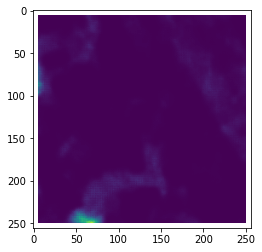

In [105]:
# change edges to missing data
Y_trim2 = Y_all2
Y_trim2[:,0:5,:,:] = np.nan
Y_trim2[:,:,0:5,:] = np.nan
Y_trim2[:,251:256,:,:] = np.nan
Y_trim2[:,:,251:256,:] = np.nan
plt.imshow(Y_trim2[1000,:,:,2])

In [110]:
def save_predict_tree2( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path(orig_dir, prefix_orig, i+1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_trim2[i, :, :, 0])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [111]:
tree_pred_dir = r'/media/hkropp/research/Kolyma_Data/predictions/v2/2020_k5_2/taiga'
save_predict_tree2(nImg = T2,xdim= 256, ydim= 256,img_dir = tree_pred_dir,prefix = "taiga_predict",orig_dir = base_dirP2 , prefix_orig = "img") 

In [112]:
def save_predict_water2( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path(orig_dir, prefix_orig, i+1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_trim2[i, :, :, 1])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [113]:
water_pred_dir = r'/media/hkropp/research/Kolyma_Data/predictions/v2/2020_k5_2/water'
save_predict_water2(nImg = T2,xdim= 256, ydim= 256,img_dir = water_pred_dir,prefix = "water_predict",orig_dir = base_dirP2 , prefix_orig = "img")

In [114]:
def save_predict_shrub2( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path(orig_dir, prefix_orig, i+1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_trim2[i, :, :, 2])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [115]:
shrub_pred_dir = r'/media/hkropp/research/Kolyma_Data/predictions/v2/2020_k5_2/shrub'
save_predict_shrub2(nImg = T2,xdim= 256, ydim= 256,img_dir = shrub_pred_dir,prefix = "shrub_predict",orig_dir = base_dirP2 , prefix_orig = "img")

In [116]:
base_dirP3 = Path(r'/media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3')

tiles = os.listdir(base_dirP3)

T3 = len(tiles)

In [117]:
# check for partial tiles
imgD1 = np.zeros((T3,2), dtype=int)



In [118]:
for i in range(T3):
    tileLoad = load_image(make_path(base_dirP3, "img", i + 1))
    imgD1[i,0] = tileLoad.shape[0]
    imgD1[i,1] = tileLoad.shape[1]

In [119]:
imgFlag = np.zeros((T3), dtype=int)

for i in range(T3):
    if imgD1[i,0] < 256 or imgD1[i,1] < 256:
        imgFlag[i] = 1
    else:
        imgFlag[i] = 0

In [120]:
imgFlag = np.zeros((T3), dtype=int)

for i in range(T3):
    if imgD1[i,0] < 256 or imgD1[i,1] < 256:
        imgFlag[i] = 1
    else:
        imgFlag[i] = 0

In [121]:
imgTable = np.zeros((T3,2), dtype=int)
for i in range(T3):
    imgTable[i,0] = imgFlag[i]
    imgTable[i,1] = i+1

In [122]:
imgFlag

array([0, 0, 0, ..., 1, 1, 1])

In [123]:
def load_stack_tiles(shape, dtype, img_dir, prefix, imgFlag):
    stack = np.zeros(shape = shape, dtype = dtype)
    for i in range(shape[0]):
        tilepath = make_path(img_dir, prefix, i + 1)
        if imgFlag[i,0] == 1:
            print("nullified", tilepath)
            stack[i,:,:,:] = np.zeros(shape = (shape[1], shape[2], shape[3]), dtype = dtype)
        else:
            stack[i, :,:,:] = load_image_rgb(tilepath, (shape[1], shape[2], shape[3]), dtype)
    return stack

In [124]:

predict_img3 = load_stack_tiles((T3, N, M, 3), np.int8, base_dirP3, "img", imgTable)

predict_img3.shape

nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_92.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_184.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_276.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_368.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_460.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_552.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_644.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_736.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_828.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_920.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_1012.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_

nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_9016.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_9108.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_9200.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_9292.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_9384.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_9476.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_9568.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_9660.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_9752.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_9844.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_9936.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles

(12144, 256, 256, 3)

In [125]:
Y_all3 = model.predict(predict_img3.reshape(T3, N, M, 3))

380/380 [==============================] - 1429s 4s/step


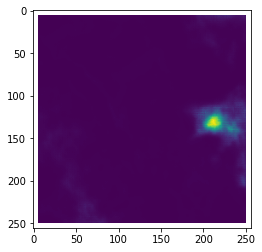

In [126]:
# change edges to missing data
Y_trim3 = Y_all3
Y_trim3[:,0:5,:,:] = np.nan
Y_trim3[:,:,0:5,:] = np.nan
Y_trim3[:,251:256,:,:] = np.nan
Y_trim3[:,:,251:256,:] = np.nan
plt.imshow(Y_trim3[1000,:,:,2])

In [127]:
def save_predict_tree3( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path(orig_dir, prefix_orig, i+1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_trim3[i, :, :, 0])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [128]:
tree_pred_dir = r'/media/hkropp/research/Kolyma_Data/predictions/v2/2020_k5_3/taiga'
save_predict_tree3(nImg = T3,xdim= 256, ydim= 256,img_dir = tree_pred_dir,prefix = "taiga_predict",orig_dir = base_dirP3 , prefix_orig = "img") 

In [129]:
def save_predict_water3( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path(orig_dir, prefix_orig, i+1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_trim3[i, :, :, 1])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [130]:
water_pred_dir = r'/media/hkropp/research/Kolyma_Data/predictions/v2/2020_k5_3/water'
save_predict_water3(nImg = T3,xdim= 256, ydim= 256,img_dir = water_pred_dir,prefix = "water_predict",orig_dir = base_dirP3 , prefix_orig = "img")

In [131]:
def save_predict_shrub3( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path(orig_dir, prefix_orig, i+1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_trim3[i, :, :, 2])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [132]:
shrub_pred_dir = r'/media/hkropp/research/Kolyma_Data/predictions/v2/2020_k5_3/shrub'
save_predict_shrub3(nImg = T3,xdim= 256, ydim= 256,img_dir = shrub_pred_dir,prefix = "shrub_predict",orig_dir = base_dirP3 , prefix_orig = "img")